In [77]:
# Imports and constants
from IPython import display
import os
import warnings
warnings.filterwarnings('ignore')

# !pip install librosa matplotlib pandas
import librosa
import matplotlib.pyplot as plt
import pandas as pd

AUDIO_PATH = 'data/segments/CroppedTrainingSet/%s/%s'
plt.rcParams['figure.figsize'] = [12, 8]

In [78]:
# Adapted from Elephant Counting Project
def load_metadata(metadata_filepath):
    # read metadata
    metadata = pd.read_csv(metadata_filepath, sep="\t", header=0)
    if 'duration' not in metadata.columns:
        metadata['duration'] = metadata['End Time (s)'] - metadata['Begin Time (s)']
    # Removing outliers
    metadata.drop(metadata[metadata.duration > 1000].index, inplace=True)
    if 'filename' not in metadata.columns:
        metadata['filename'] = metadata['Begin File'].apply(lambda x: os.path.basename(x))
    return metadata[['Selection', 'File Offset (s)', 'filename', 'duration']]

In [79]:
# Load audio file
def plot_audio(filename):
    path = AUDIO_PATH % (filename.split('_')[0], filename)

    signal_data, sampling_frequency = librosa.load(path)

    # Plot the signal read from wav file

    plt.subplot(121)
    plt.title('Spectrogram of an audio file')
    plt.plot(signal_data)
    plt.xlabel('Sample')
    plt.ylabel('Amplitude')

    plt.subplot(122)
    plt.specgram(signal_data, Fs=sampling_frequency)
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.show()
    return signal_data, sampling_frequency

In [80]:
# Read in ELP metadata file
elp_metadata = load_metadata('Combined File.txt')
elp_metadata

,Selection,File Offset (s),filename,duration
0,1,9138.9317,nn06e_20190219_000000.wav,2.012418
1,2,18896.1614,nn06e_20181228_000000.wav,7.714270
2,3,15664.7329,nn06e_20181115_000000.wav,8.310540
3,4,16494.6708,nn06e_20181115_000000.wav,7.490660
4,5,16528.5466,nn06e_20181115_000000.wav,4.173910
...,...,...,...,...
911,912,62725.3415,nn04c_20180308_000000.wav,6.186320
912,913,63286.6955,nn04c_20180308_000000.wav,6.745330
913,914,63785.4410,nn04c_20180308_000000.wav,7.490670
914,915,68759.2919,nn04c_20180308_000000.wav,6.447190


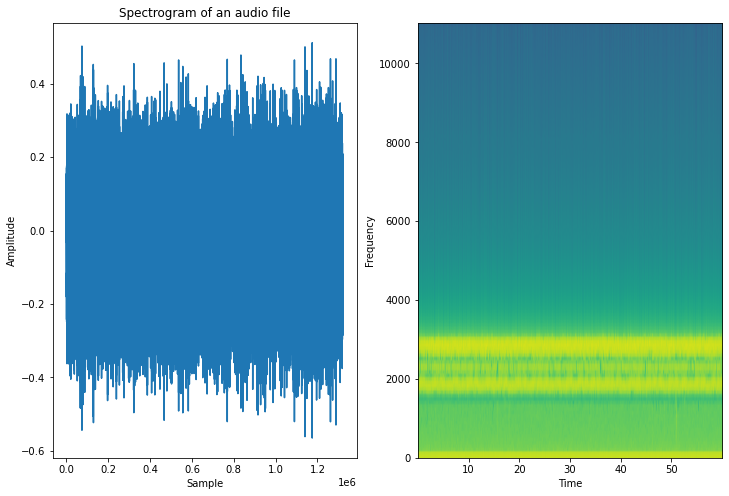

In [81]:
# Display audio clip from ELP file
signal_data, sampling_frequency = plot_audio(
    'nn04c_20180308_000000_69667006.1_69727006.1_cropped.wav')
IPython.display.Audio(signal_data, rate=sampling_frequency)

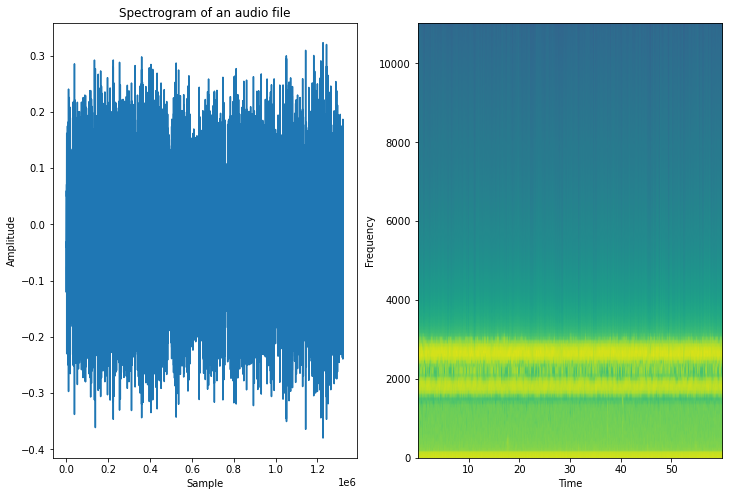

In [82]:
# Display second audio clip from ELP file
signal_data, sampling_frequency = plot_audio(
    'nn04c_20180308_000000_2951627.3000000003_3011627.3000000003_cropped.wav')
IPython.display.Audio(signal_data, rate=sampling_frequency)

In [83]:
# Read in the Elephant Counting Project training metadata file
ecp_metadata = load_metadata('nn_ele_hb_00-24hr_TrainingSet_v2.txt')
ecp_metadata

,Selection,File Offset (s),filename,duration
1,2,48865.100,nn01a_20180126_000000.wav,3.8974
2,3,48869.829,nn01a_20180126_000000.wav,4.2672
3,4,48876.017,nn01a_20180126_000000.wav,4.0640
4,5,48880.487,nn01a_20180126_000000.wav,4.3227
5,6,49017.105,nn01a_20180126_000000.wav,3.5837
...,...,...,...,...
3175,3176,86263.733,nn10b_20180728_000000.wav,2.2700
3176,3177,86264.870,nn10b_20180728_000000.wav,6.4400
3177,3178,86269.957,nn10b_20180728_000000.wav,6.3800
3178,3179,86300.628,nn10b_20180728_000000.wav,3.4700


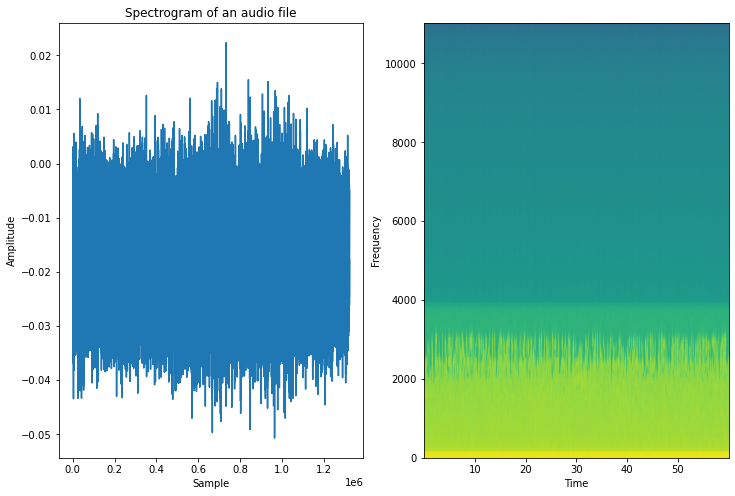

In [84]:
# Display audio clip from Elephant Counting Project training file
signal_data, sampling_frequency = plot_audio(
    'nn01a_20180126_000000_48835100.0_48895100.0_cropped.wav')
IPython.display.Audio(signal_data, rate=sampling_frequency)

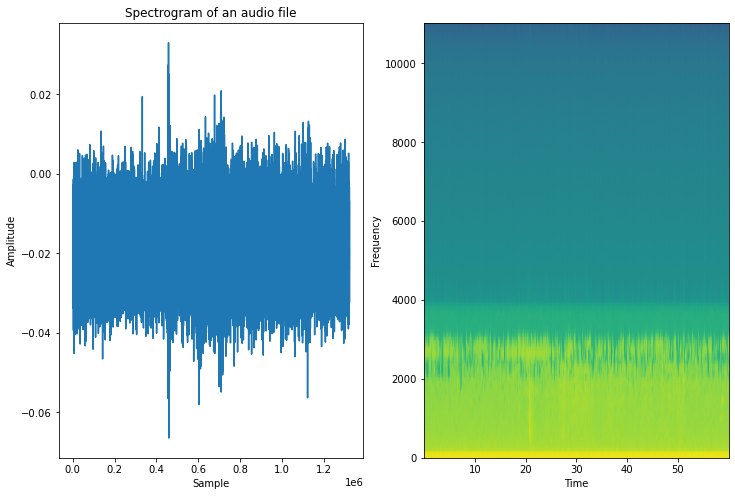

In [85]:
# Display second audio clip from Elephant Counting Project training file
signal_data, sampling_frequency = plot_audio(
    'nn01a_20180126_000000_48987105.0_49047105.0_cropped.wav')
IPython.display.Audio(signal_data, rate=sampling_frequency)